In [60]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random
from shutil import copyfile
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, Flatten, Dense
import datetime
from google.colab import files
import numpy as np
from skimage import transform

# 1. Data

## 1.1 Memes
Collected by the following searches:
- Memes from Argentina
- Memes from 2020
- Old memes
- New memes

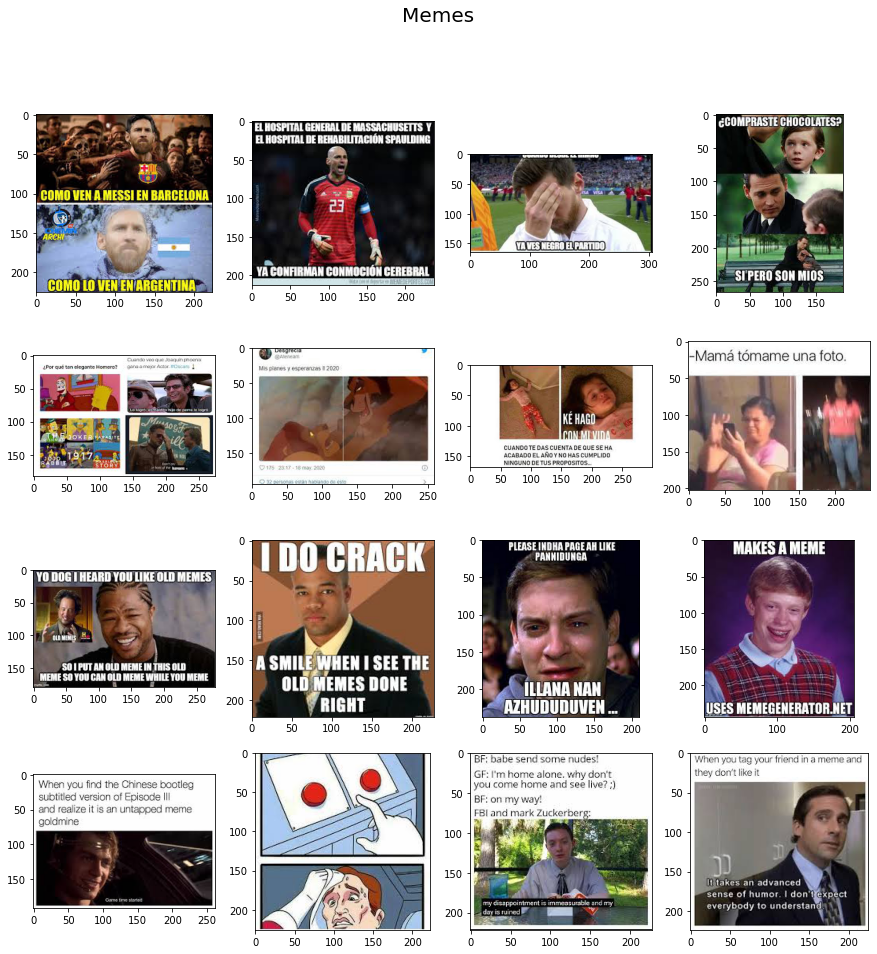

In [2]:
#Memes plot
path = '/content/drive/My Drive/MemeDetector/images/'

f, ax = plt.subplots(nrows = 4, ncols=4, figsize=(15,15))
plt.suptitle('Memes', fontsize=20)

for j in range(4):
  image_path = f'memes/{j}_argentina.jpg'
  img = mpimg.imread(path + image_path)
  ax[0,j].imshow(img)

for j in range(4):
  image_path = f'memes/{j}_2020.jpg'
  img = mpimg.imread(path + image_path)
  ax[1,j].imshow(img)

for j in range(4):
  image_path = f'memes/{j}_old.jpg'
  img = mpimg.imread(path + image_path)
  ax[2,j].imshow(img)

for j in range(4):
  image_path = f'memes/{j}.jpg'
  img = mpimg.imread(path + image_path)
  ax[3,j].imshow(img)

plt.show()

In [3]:
#Memes count
vv = 0
old = 0
new = 0
arg = 0
for file in os.listdir('/content/drive/My Drive/MemeDetector/images/memes/'):
  if file.endswith('_argentina.jpg'):
    arg += 1

  elif file.endswith('_old.jpg'):
    old += 1

  elif file.endswith('_2020.jpg'):
    vv += 1
  
  else:
    new += 1

print('MEME IMAGES:\nArgentina memes:',arg,'\nOld memes:',old,'\n2020 memes:',vv,'\nNew memes:',new)
print('TOTAL MEME IMAGES',old+new+vv+arg)

MEME IMAGES:
Argentina memes: 239 
Old memes: 422 
2020 memes: 242 
New memes: 100
TOTAL MEME IMAGES 1003


## 1.2 Normal photos
Collected by the following searches:

- bar amigos
- mendoza argentina
- gimnasio
- family photo
- selfie real
- university classroom
- party photos
- landscape photos
- autos usados


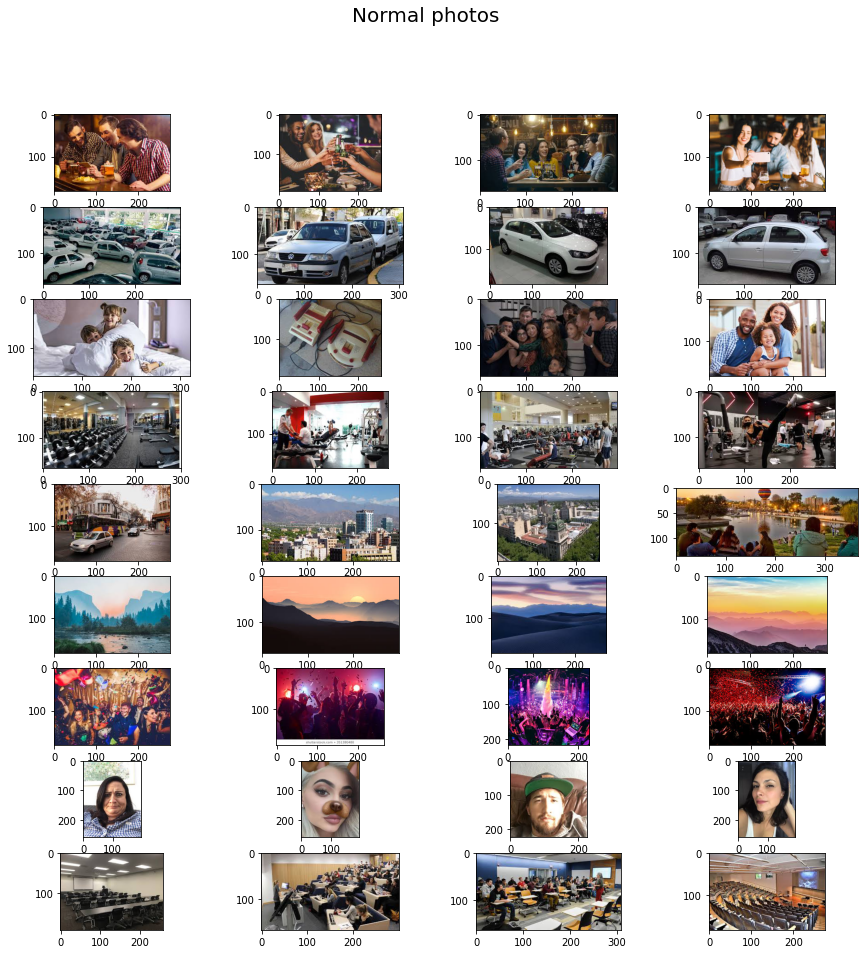

In [4]:
#Normal plot
path = '/content/drive/My Drive/MemeDetector/images/'

f, ax = plt.subplots(nrows = 9, ncols=4, figsize=(15,15))
plt.suptitle('Normal photos', fontsize=20)

for j in range(4):
  image_path = f'normal/{j}_bar.jpg'
  img = mpimg.imread(path + image_path)
  ax[0,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j}_cars.jpg'
  img = mpimg.imread(path + image_path)
  ax[1,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j+100}_family.jpg'
  img = mpimg.imread(path + image_path)
  ax[2,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j}_gym.jpg'
  img = mpimg.imread(path + image_path)
  ax[3,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j}_mendoza.jpg'
  img = mpimg.imread(path + image_path)
  ax[4,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j}_paisaje.jpg'
  img = mpimg.imread(path + image_path)
  ax[5,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j}_party.jpg'
  img = mpimg.imread(path + image_path)
  ax[6,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j}_selfie.jpg'
  img = mpimg.imread(path + image_path)
  ax[7,j].imshow(img)

for j in range(4):
  image_path = f'normal/{j}_universidad.jpg'
  img = mpimg.imread(path + image_path)
  ax[8,j].imshow(img)

plt.show()

In [11]:
#Normal counts
bar = 0
cars = 0
family = 0
gym = 0
mendoza = 0
paisaje = 0
party = 0
selfie = 0
univ = 0

for file in os.listdir('/content/drive/My Drive/MemeDetector/images/normal/'):
  if file.endswith('bar.jpg'):
    bar += 1
  elif file.endswith('cars.jpg'):
    cars += 1
  elif file.endswith('family.jpg'):
    family += 1
  if file.endswith('gym.jpg'):
    gym += 1
  elif file.endswith('mendoza.jpg'):
    mendoza += 1
  elif file.endswith('paisaje.jpg'):
    paisaje += 1
  if file.endswith('party.jpg'):
    party += 1
  elif file.endswith('selfie.jpg'):
    selfie += 1
  elif file.endswith('universidad.jpg'):
    univ += 1
    
print('NORMAL IMAGES:\nBar:',bar,'\nCars:',cars,'\nFamily:',family,'\nGym:',gym,'\nMendoza:',mendoza,'\nPaisaje:',paisaje,'\nParty:',party,'\nSelfie',selfie,'\nUniversity',univ)
print('TOTAL NORMAL IMAGES:',bar+cars+family+gym+mendoza+paisaje+party+selfie+univ)

NORMAL IMAGES:
Bar: 263 
Cars: 113 
Family: 156 
Gym: 170 
Mendoza: 160 
Paisaje: 416 
Party: 83 
Selfie 106 
University 98
TOTAL NORMAL IMAGES: 1565


## 1.3 Split train/test
- First I need to make the dir for the training and testing sets for each class.
- Then I will move shuffled images to those dirs.

*Some code was taken from the Coursera - Deeplearning.ai TensorFlow developer specialization*

In [14]:
#Create directories to split the images into training and testing sets.
os.mkdir('/content/drive/My Drive/MemeDetector/images/split/')
os.mkdir('/content/drive/My Drive/MemeDetector/images/split/training/')
os.mkdir('/content/drive/My Drive/MemeDetector/images/split/testing/')
os.mkdir('/content/drive/My Drive/MemeDetector/images/split/training/memes/')
os.mkdir('/content/drive/My Drive/MemeDetector/images/split/training/normal/')
os.mkdir('/content/drive/My Drive/MemeDetector/images/split/testing/memes/')
os.mkdir('/content/drive/My Drive/MemeDetector/images/split/testing/normal/')

In [15]:
def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE, SAMPLES):

  '''
  This function takes the source folder, and split random images into training and testing folders.

  SOURCE = source directory
  TRAINING = training directory
  TESTING = testing directory
  SPLIT_SIZE = % to split into training set
  SAMPLES = number of samples per class
  '''

  #Append images from SOURCE folder
  dataset = []
  for img in os.listdir(SOURCE):
      path = SOURCE + img
      if (os.path.getsize(path) > 0):
          dataset.append(img)

  #Split values
  train_data_length = int(SAMPLES * SPLIT_SIZE)
  test_data_length = int(SAMPLES - train_data_length)

  #Shuffle images and split
  shuffled_set = random.sample(dataset, len(dataset))
  train_set = shuffled_set[0:train_data_length]
  test_set = shuffled_set[-test_data_length:]
  
  #Train set
  for img in train_set:
      temp_train_data = SOURCE + img
      final_train_data = TRAINING + img
      copyfile(temp_train_data, final_train_data)
  
  print('\tTrain -> Done')

  #Test set
  for img in test_set:
      temp_test_data = SOURCE + img
      final_test_data = TESTING + img
      copyfile(temp_test_data, final_test_data)

  print('\tTest -> Done')

#Folders
MEMES_SOURCE_DIR = "/content/drive/My Drive/MemeDetector/images/memes/"
TRAINING_MEMES_DIR = "/content/drive/My Drive/MemeDetector/images/split/training/memes/"
TESTING_MEMES_DIR = "/content/drive/My Drive/MemeDetector/images/split/testing/memes/"

NORMAL_SOURCE_DIR = "/content/drive/My Drive/MemeDetector/images/normal/"
TRAINING_NORMAL_DIR = "/content/drive/My Drive/MemeDetector/images/split/training/normal/"
TESTING_NORMAL_DIR = "/content/drive/My Drive/MemeDetector/images/split/testing/normal/"

#Split size
split_size = .8

#Run function (this took a while)
#I will be training with 800 images and testing themodel with 200.
print('Memes')
split_data(MEMES_SOURCE_DIR, TRAINING_MEMES_DIR, TESTING_MEMES_DIR, split_size,1000)
print('Memes -> done')
print('\nNormal')
split_data(NORMAL_SOURCE_DIR, TRAINING_NORMAL_DIR, TESTING_NORMAL_DIR, split_size,1000)
print('Normal -> done')

Memes
	Train -> Done
	Test -> Done
Memes -> done

Normal
	Train -> Done
	Test -> Done
Normal -> done


In [16]:
#Images verification
print('Length of splits')
print('Train - memes:',len(os.listdir('/content/drive/My Drive/MemeDetector/images/split/training/memes/')))
print('Train - normal:',len(os.listdir('/content/drive/My Drive/MemeDetector/images/split/training/normal/')))
print('Test - memes:',len(os.listdir('/content/drive/My Drive/MemeDetector/images/split/testing/memes/')))
print('Test - normal:',len(os.listdir('/content/drive/My Drive/MemeDetector/images/split/testing/normal/')))

Length of splits
Train - memes: 800
Train - normal: 800
Test - memes: 200
Test - normal: 200


## 1.4 Preprocessing
I will be using the ImageDataGenerator to:
- Rescale (%255)
- Data augmentation
- Define batches
- Define image size

In [17]:
#Images directories
TRAINING_DIR = "/content/drive/My Drive/MemeDetector/images/split/training/"
VALIDATION_DIR = "/content/drive/My Drive/MemeDetector/images/split/testing/"

# Add our data-augmentation parameters to ImageDataGenerator to add more samples.
train_datagen = ImageDataGenerator(rescale = 1./255., #Rescales the values
                                   rotation_range = 10, #Rotates the image between 10º and 0º
                                   width_shift_range = 0.2, #reshape the width
                                   height_shift_range = 0.2, #reshape the height
                                   shear_range = 0.2, #shifts one part of the image
                                   zoom_range = 0.2) #Making vertical/horizontal flip hurts the model, because the is text in meme images.

# The validation data should not be augmented
test_datagen = ImageDataGenerator(rescale = 1./255.)

#Make the generators.
train_generator = train_datagen.flow_from_directory(TRAINING_DIR, #Directory for training images
                                                    batch_size = 16, #Batch size
                                                    class_mode = 'binary', #Binary classification
                                                    target_size = (150, 150)) #Make all images the same size

#Same to the validation images.
validation_generator =  test_datagen.flow_from_directory(VALIDATION_DIR,
                                                         batch_size = 1,
                                                         class_mode = 'binary',
                                                         target_size = (150, 150))

Found 1600 images belonging to 2 classes.
Found 400 images belonging to 2 classes.


# 2. Model

## 2.1 Baseline model

In [32]:
#Baseline model using Keras Sequential API

model = Sequential()
#256 filters Conv layer + ReLu activation + MaxPooling 2x2
model.add(Conv2D(256, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

#256 filters Conv layer + ReLu activation + MaxPooling 2x2
model.add(Conv2D(256, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

#Flatten layer
model.add(Flatten()) 

#Dense layer
model.add(Dense(64))

#Output layer
model.add(Dense(1))
model.add(Activation('sigmoid'))

#Optimizer and Callback to find best learning rate
opt = tf.keras.optimizers.Adam(learning_rate = 0.001)
lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch / 20))

#TensorBoard Callback
path = 'logs/fit/' + datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = path, histogram_freq = 1)

#Compile the model
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

#Fit the model
history = model.fit_generator(train_generator,
                              epochs=100,
                              verbose=1,
                              validation_data = validation_generator, 
                              callbacks = [lr_schedule,tensorboard_callback])

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/100
  1/100 [..............................] - ETA: 0s - loss: 0.7120 - accuracy: 0.2500WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
100/100 [==============================] - 17s 168ms/step - loss: 0.6903 - accuracy: 0.4975 - val_loss: 0.6912 - val_accuracy: 0.4925
Epoch 2/100
100/100 [==============================] - 17s 166ms/step - loss: 0.6893 - accuracy: 0.5050 - val_loss: 0.6903 - val_accuracy: 0.4925
Epoch 3/100
100/100 [==============================] - 17s 167ms/step - loss: 0.6886 - accuracy: 0.5025 - val_loss: 0.6894 - val_accuracy: 0.4900
Epoch 4/100
100/100 [==============================] - 17s 167ms/step - loss: 0.6884 - accuracy: 0.5063 - val_loss: 0.6884 -

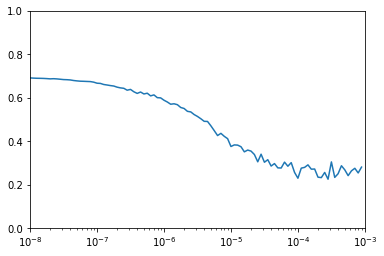

In [40]:
#Learning rate plot
plt.semilogx(history.history["lr"], history.history["loss"])
plt.axis([1e-8, 1e-3, 0, 1])
plt.show()

#learning_rate = 5e-6

In [47]:
model = Sequential()
#256 filters Conv layer + ReLu activation + MaxPooling 2x2
model.add(Conv2D(256, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

#256 filters Conv layer + ReLu activation + MaxPooling 2x2
model.add(Conv2D(256, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

#Flatten layer
model.add(Flatten()) 

#Dense layer
model.add(Dense(64))

#Output layer
model.add(Dense(1))
model.add(Activation('sigmoid'))

#Optimizer
opt = tf.keras.optimizers.Adam(learning_rate = 5e-6)

#TensorBoard Callback
path = 'logs/fit/' + datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = path, histogram_freq = 1)

#Compile the model
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

#Fit the model
history = model.fit_generator(train_generator,
                              epochs=50,
                              verbose=1,
                              validation_data = validation_generator, 
                              callbacks = [tensorboard_callback])

Epoch 1/50
100/100 [==============================] - 16s 156ms/step - loss: 0.6622 - accuracy: 0.5881 - val_loss: 0.5592 - val_accuracy: 0.7675
Epoch 2/50
100/100 [==============================] - 15s 153ms/step - loss: 0.6054 - accuracy: 0.6881 - val_loss: 0.5028 - val_accuracy: 0.7300
Epoch 3/50
100/100 [==============================] - 15s 153ms/step - loss: 0.5993 - accuracy: 0.6719 - val_loss: 0.4940 - val_accuracy: 0.7325
Epoch 4/50
100/100 [==============================] - 15s 153ms/step - loss: 0.5533 - accuracy: 0.7219 - val_loss: 0.4315 - val_accuracy: 0.8050
Epoch 5/50
100/100 [==============================] - 15s 153ms/step - loss: 0.5415 - accuracy: 0.7337 - val_loss: 0.4144 - val_accuracy: 0.8175
Epoch 6/50
100/100 [==============================] - 15s 154ms/step - loss: 0.5140 - accuracy: 0.7544 - val_loss: 0.4326 - val_accuracy: 0.7775
Epoch 7/50
100/100 [==============================] - 15s 153ms/step - loss: 0.5099 - accuracy: 0.7625 - val_loss: 0.4163 - val_ac

In [48]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.

### Test some images

In [69]:
#Upload two images from my disk
meme = files.upload()
normal = files.upload()

Saving meme.jpeg to meme.jpeg


Saving yo.jpg to yo.jpg


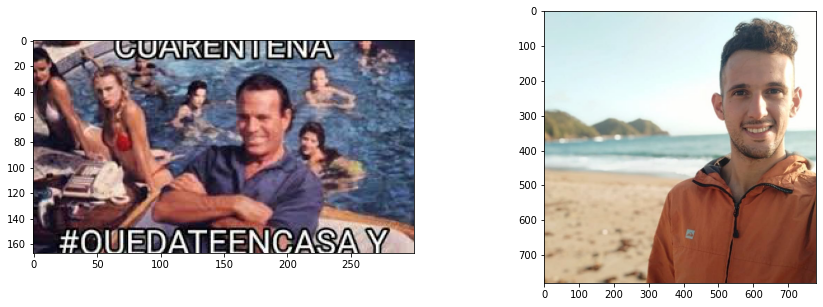

In [71]:
#Plot images
meme = mpimg.imread('/content/meme.jpeg')
normal = mpimg.imread('/content/yo.jpg')

f, ax = plt.subplots(ncols = 2, figsize=(15,5))
ax[0].imshow(meme)
ax[1].imshow(normal)
plt.show()

In [93]:
#The model expect a (1,150,150,3) shape input.

#Resize to 150x150
meme = transform.resize(meme, (150, 150, 3))
normal = transform.resize(normal, (150, 150, 3))

#Add one dimension
meme_pro = np.expand_dims(meme, axis=0)
norml_pro = image = np.expand_dims(normal, axis=0)


print('Images reshaped dimensions:\nNormal:',norml_pro.shape,'\nMeme:', meme_pro.shape)

Images reshaped dimensions:
Normal: (1, 150, 150, 3) 
Meme: (1, 150, 150, 3)


In [99]:
#Make predictions
print('Classes assigned by the Image Generator -->',train_generator.class_indices)
print('Meme prediction:',model.predict(meme_pro)[0][0],'-->',round(model.predict(meme_pro)[0][0]))
print('Normal prediction:',model.predict(norml_pro)[0][0],'-->',round(model.predict(norml_pro)[0][0]))

Classes assigned by the Image Generator --> {'memes': 0, 'normal': 1}
Meme prediction: 0.0037464385 --> 0.0
Normal prediction: 0.86807996 --> 1.0


In [100]:
#Save model
model.save('/content/drive/My Drive/MemeDetector/')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /content/drive/My Drive/MemeDetector/assets


## 2.2 InceptionV3 pretrained model

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

#Download the weights from the trained model.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5


path_inception = "/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5"
local_weights_file = path_inception

#Create model
pre_trained_model = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False, 
                                weights = None)

pre_trained_model.load_weights(local_weights_file)

# Make all the layers in the pre-trained model non-trainable
for layer in pre_trained_model.layers:
    layer.trainable = False

#Select last layer to use
last_layer = pre_trained_model.get_layer('mixed7')
last_output = last_layer.output

--2020-08-31 21:25:59--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.188.128, 64.233.189.128, 108.177.97.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.188.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M  22.4MB/s    in 3.7s    

2020-08-31 21:26:04 (22.4 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
#Create model using the Keras Functional API
#Last output from the InceptionV3 model
x = tf.keras.layers.Flatten()(last_output)
#512 units dense layer
x = tf.keras.layers.Dense(512, activation='relu')(x)
#Dropout layer
x = tf.keras.layers.Dropout(0.2)(x)
#Output layer
x = tf.keras.layers.Dense(1, activation='sigmoid')(x)           

#Model
model = tf.keras.Model(pre_trained_model.input, x)

opt = tf.keras.optimizers.Adam(lr = 0.0001)

model.compile(optimizer = opt, 
              loss = 'binary_crossentropy', 
              metrics = ['accuracy'])

history = model.fit(train_generator,
                    validation_data=validation_generator,
                    epochs=100,
                    verbose=1)

Epoch 1/100
 23/100 [=====>........................] - ETA: 20:28 - loss: 0.2508 - accuracy: 0.8967